# CAM

SEOYEON CHOI  
2023-08-28

https://seoyeonc.github.io/chch/cnn/feature%20extraction/big%20data%20analysis/2022/01/11/bd_9주차.html

https://seoyeonc.github.io/chch/cam/2022/01/10/bd-8주차_1.html

# import

In [42]:
import torch 
from fastai.vision.all import *
import cv2
import numpy as np
import os
os.environ['CUDA_LAUNCH_BLOCKING'] = "1"
os.environ["CUDA_VISIBLE_DEVICES"] = "0"
import cv2
import numpy as np
import matplotlib.pyplot as plt
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageFile
from PIL import Image
ImageFile.LOAD_TRUNCATED_IMAGES = True
from torchvision.utils import save_image
import os

In [4]:
import rpy2
import rpy2.robjects as ro 
from rpy2.robjects.vectors import FloatVector 
from rpy2.robjects.packages import importr

In [5]:
def label_func(f):
    if f[0].isupper():
        return 'cat' 
    else: 
        return 'dog' 

# (1) 랜덤박스가 들어간 개 고양이 그림

In [825]:
path=untar_data(URLs.PETS)/'images'

In [826]:
path.ls()

In [23]:
files=get_image_files(path)

In [25]:
dls=ImageDataLoaders.from_name_func(path,files,label_func,item_tfms=Resize(512)) 

In [ ]:
lrnr=cnn_learner(dls,resnet34,metrics=error_rate)
lrnr.fine_tune(1)

In [40]:
net1=lrnr.model[0]
net2=lrnr.model[1] 

In [41]:
net2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(),
    torch.nn.Linear(512,out_features=2,bias=False))

In [42]:
net=torch.nn.Sequential(net1,net2)

In [43]:
lrnr2=Learner(dls,net,metrics=accuracy) 

In [ ]:
lrnr2.fine_tune(10) 

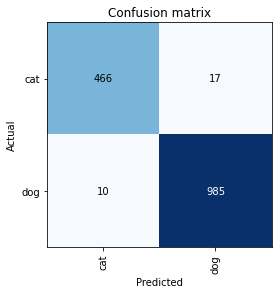

In [55]:
interp = ClassificationInterpretation.from_learner(lrnr2)
interp.plot_confusion_matrix()

In [56]:
interp.print_classification_report()

              precision    recall  f1-score   support

         cat       0.98      0.96      0.97       483
         dog       0.98      0.99      0.99       995

    accuracy                           0.98      1478
   macro avg       0.98      0.98      0.98      1478
weighted avg       0.98      0.98      0.98      1478


In [33]:
path=untar_data(URLs.PETS)/'images'

In [61]:
if str(list(path.ls())[103]).split('/')[-1].split('.')[-1]=="jpg" :
    print("jpg")
#name=str(list(path.ls())[i]).split('/')[-1]

jpg

In [62]:
path.ls()

In [ ]:
for i in range(7393) :
    img = PILImage.create(get_image_files(path)[i])
    img = img.resize([512,512], resample=None, box=None, reducing_gap=None)
    name = str(list(path.ls())[i]).split('/')[-1]
    fname = name.split('.')[-1]
    if fname!="jpg" : 
        print(name)
    else : pass

`.mat` 파일 같은 이상한 거 삭제

In [ ]:
# os.remove(r"/home/csy/.fastai/data/oxford-iiit-pet/images/Abyssinian_100.mat")

In [62]:
# os.remove(r"/home/csy/.fastai/data/oxford-iiit-pet/images/Abyssinian_102.mat")

In [63]:
# os.remove(r"/home/csy/.fastai/data/oxford-iiit-pet/images/Abyssinian_101.mat")

In [ ]:
path.ls()

# 랜덤박스

In [41]:
# os.mkdir("random_pet_one")

In [42]:
for i in range(len(path.ls())) :
    img = PILImage.create(get_image_files(path)[i])
    img = img.resize([512,512], resample=None, box=None, reducing_gap=None)
    (w, h) = (img.shape[0], img.shape[1])
    a = random.uniform(0, w*0.7)
    b = random.uniform(0, h*0.9)
    shape = [(a, b), (a+85, b+85)]
    font = ImageFont.truetype("DejaVuSans.ttf", round(h*0.075))
    name = str(list(path.ls())[i]).split('/')[-1]
    fname = name.split('.')[-1]
    if name[0].isupper() == True :
        img1 = ImageDraw.Draw(img)  
        img1.rectangle(shape, fill ="white", outline ="black")
        ImageDraw.Draw(img).text((a+5, b+15), 'Cat', (0,0,0), font=font)
        img.save("random_pet_one/"+name)
    else: 
        img1 = ImageDraw.Draw(img)  
        img1.rectangle(shape, fill ="black", outline ="black")
        ImageDraw.Draw(img).text((a+5, b+15), 'Dog', (255,255,255), font=font)
        img.save("random_pet_one/"+name)

In [6]:
path_r=Path('random_pet_one')   #랜덤박스넣은사진

In [7]:
files=get_image_files(path_r)

In [8]:
dls_r=ImageDataLoaders.from_name_func(path_r,files,label_func,item_tfms=Resize(512)) 

In [ ]:
lrnr_r1=cnn_learner(dls_r,resnet34,metrics=error_rate)
lrnr_r1.fine_tune(2)

/home/csy/anaconda3/envs/temp_csy/lib/python3.8/site-packages/fastai/vision/learner.py:288: UserWarning: `cnn_learner` has been renamed to `vision_learner` -- please update your code
  warn("`cnn_learner` has been renamed to `vision_learner` -- please update your code")
/home/csy/anaconda3/envs/temp_csy/lib/python3.8/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/csy/anaconda3/envs/temp_csy/lib/python3.8/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet34_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet34_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)

In [ ]:
net_1=lrnr_r1.model[0]
net_2=lrnr_r1.model[1] 

In [ ]:
net_2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(),
    torch.nn.Linear(512,out_features=2,bias=False))

In [ ]:
net_r=torch.nn.Sequential(net_1,net_2)

In [ ]:
lrnr_r2=Learner(dls_r,net_r,metrics=accuracy) 

10번째임

In [ ]:
lrnr_r2.fine_tune(15) 

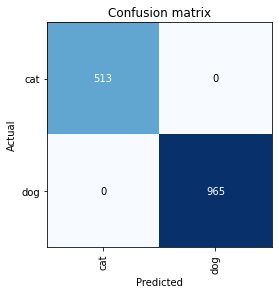

In [43]:
interp = ClassificationInterpretation.from_learner(lrnr_r2)
interp.plot_confusion_matrix()

In [44]:
x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[100])]))

In [163]:
camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())

In [46]:
from rpy2.robjects.packages import importr
from rpy2.robjects.vectors import FloatVector 

In [47]:
ebayesthresh = importr('EbayesThresh').ebayesthresh

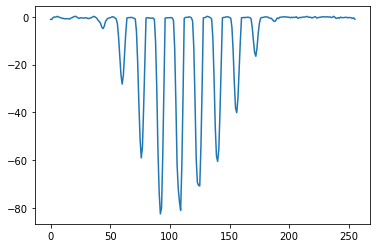

In [48]:
plt.plot(camimg[0].detach().reshape(-1))

In [49]:
_power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))

  _power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))

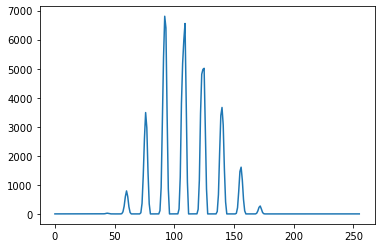

In [50]:
plt.plot(_power_threshed)

In [67]:
_ybar_threshed = np.where(_power_threshed>1000,torch.tensor(camimg[0].detach().reshape(-1)),0)

  _ybar_threshed = np.where(_power_threshed>1000,torch.tensor(camimg[0].detach().reshape(-1)),0)

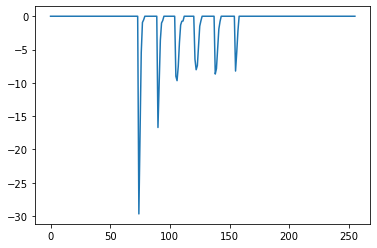

In [68]:
plt.plot(_ybar_threshed)

In [53]:
_test=camimg[0]-torch.min(camimg[0])

In [54]:
_A1=torch.exp(-0.1*_test)

In [55]:
_X1=np.array(_A1.to("cpu").detach(),dtype=np.float32)

In [56]:
_Y1=torch.Tensor(cv2.resize(_X1,(512,512),interpolation=cv2.INTER_LINEAR))

In [ ]:
_x1=x.squeeze().to('cpu')*_Y1-torch.min(x.squeeze().to('cpu'))*_Y1

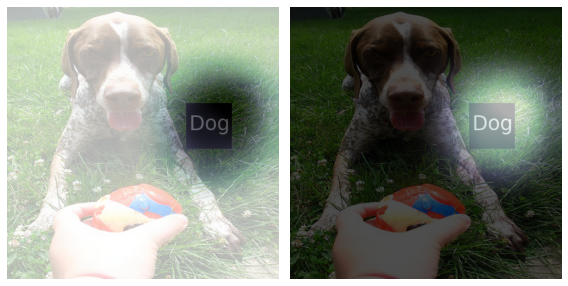

In [60]:
# 서연 수정 code
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg[0].to("cpu").detach(),alpha=0.7,extent=(0,511,511,0),interpolation='spline36',cmap='bone')
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg[1].to("cpu").detach(),alpha=0.7,extent=(0,511,511,0),interpolation='spline36',cmap='bone')
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

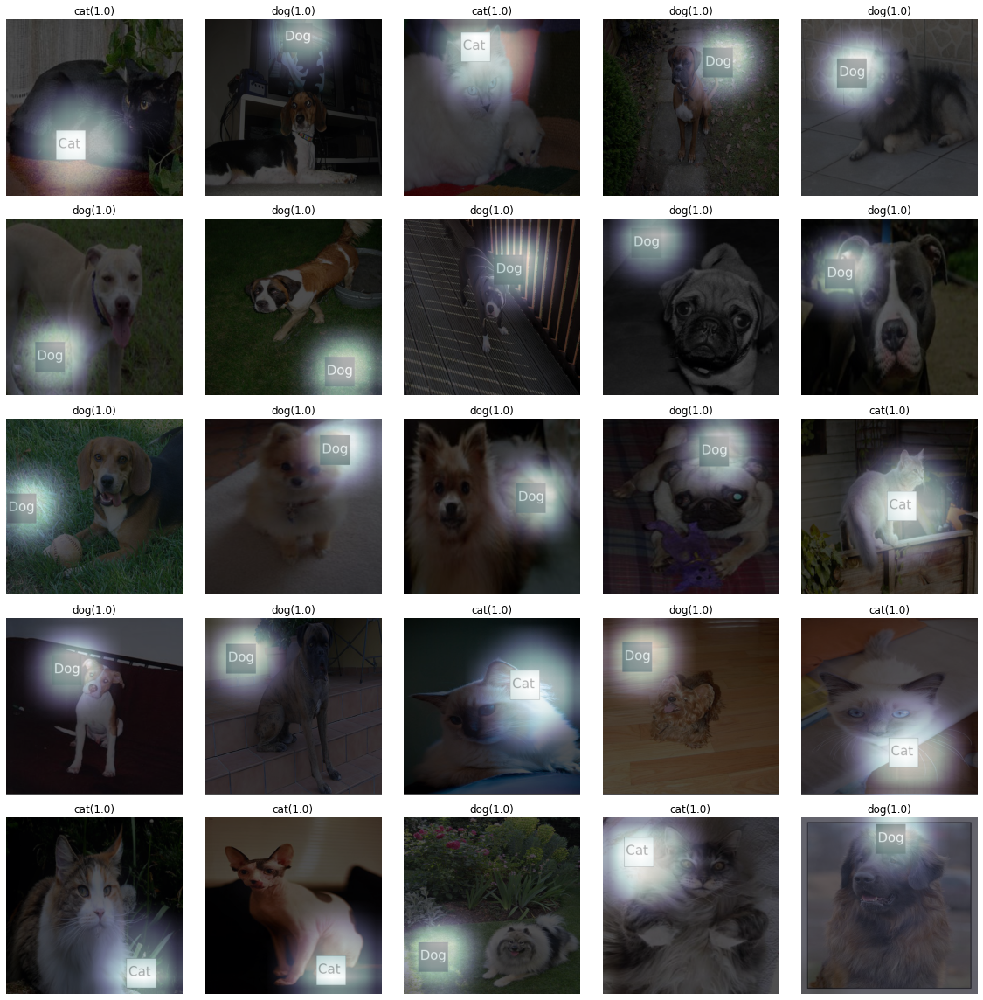

In [61]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[k])]))
        camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
        a,b = net_r(x).tolist()[0]
        catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b)) 
        if catprob>dogprob: 
            dls_r.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[0].to("cpu").detach(),alpha=0.7,extent=(0,512,512,0),interpolation='bilinear',cmap='bone')
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            dls_r.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[1].to("cpu").detach(),alpha=0.7,extent=(0,512,512,0),interpolation='bilinear',cmap='bone')
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

## thresholding point

  power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
<ipython-input-818-98bb7127f6af>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
<ipython-input-818-98bb7127f6af>:12: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
<ipython-input-818-98bb7127f6af>:13: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
 

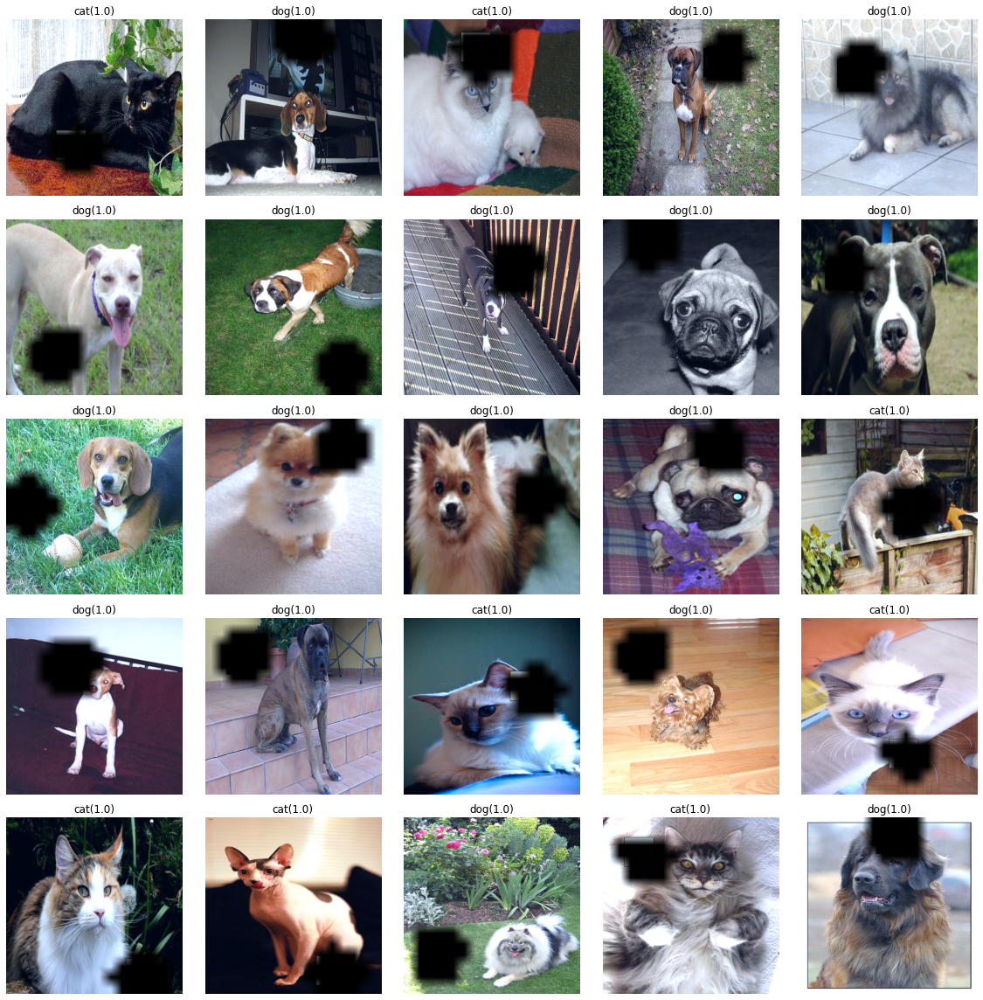

In [818]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[k])]))
        camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
        a,b = net_r(x).tolist()[0]
        catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))
        ebayesthresh = importr('EbayesThresh').ebayesthresh
        power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
        ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
        power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
        ybar_threshed2 = np.where(power_threshed>2000,torch.tensor(camimg[1].detach().reshape(-1)),0)
        ybar_threshed = torch.tensor(ybar_threshed.reshape(16,16))
        ybar_threshed2 = torch.tensor(ybar_threshed2.reshape(16,16))
        if catprob>dogprob: 
            # test=camimg[0]-torch.min(camimg[0])
            A1=torch.exp(-0.1*ybar_threshed)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1
            (x1*0.25).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            # test=camimg[1]-torch.min(camimg[1])
            A1=torch.exp(-0.1*ybar_threshed2)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1
            (x1*0.25).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

## ebayes X

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping i

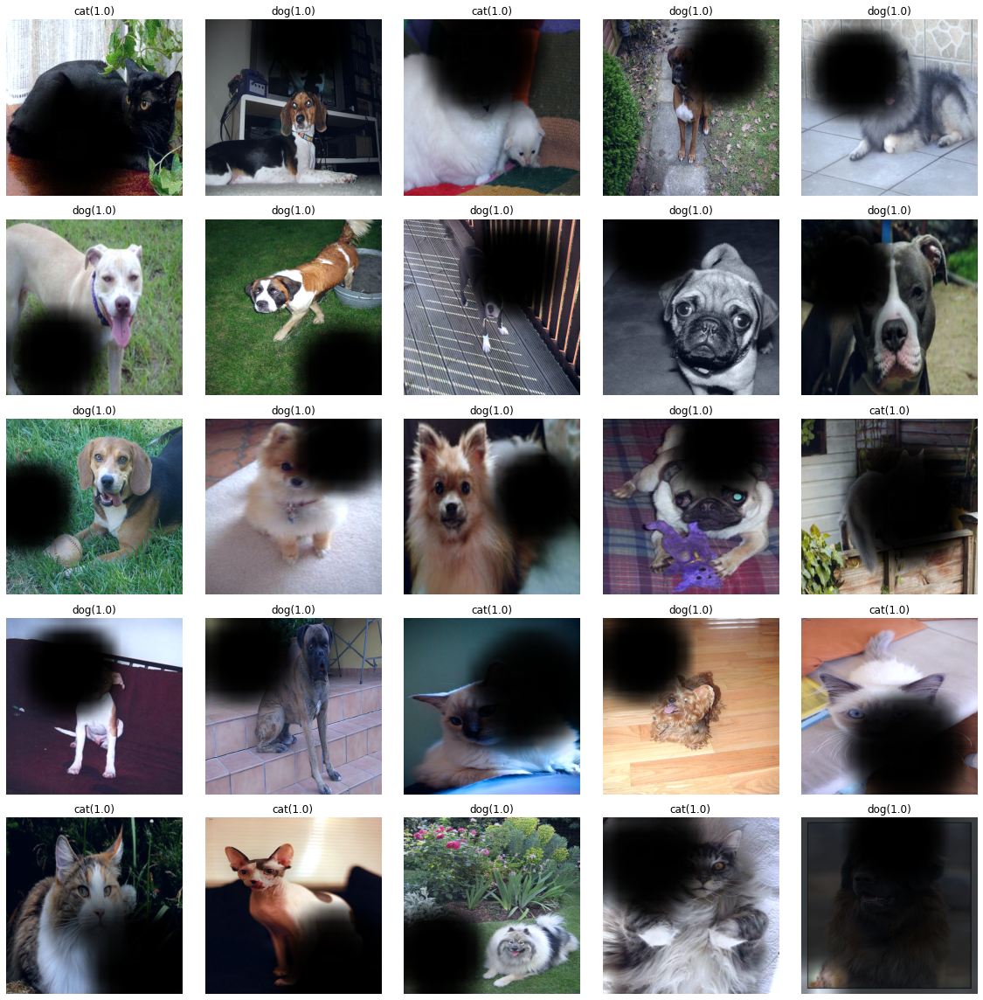

In [ ]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[k])]))
        camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
        a,b = net_r(x).tolist()[0]
        catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))
        if catprob>dogprob: 
            test=camimg[0]-torch.min(camimg[0])
            A1=torch.exp(-0.1*test)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1
            (x1*0.25).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            test=camimg[1]-torch.min(camimg[1])
            A1=torch.exp(-0.1*test)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1
            (x1*0.25).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

In [833]:
# os.mkdir("random_pet_mask1")

In [ ]:
for i in range(len(path_r.ls())) :
    name = str(list(path_r.ls())[i]).split('/')[-1]  #이름통일
    x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[i])]))
    camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
    a,b = net_r(x).tolist()[0]
    catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))
    ebayesthresh = importr('EbayesThresh').ebayesthresh
    power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
    ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
    power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
    ybar_threshed2 = np.where(power_threshed>2000,torch.tensor(camimg[1].detach().reshape(-1)),0)
    ybar_threshed = torch.tensor(ybar_threshed.reshape(16,16))
    ybar_threshed2 = torch.tensor(ybar_threshed2.reshape(16,16))        
    if catprob>dogprob: 
        # test=camimg[0]-torch.min(camimg[0])
        A1=torch.exp(-0.1*ybar_threshed)
        X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
        Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
        x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu')*Y1)
        save_image((x1*0.25), "random_pet_mask1/"+name)
    else: 
        # test=camimg[1]-torch.min(camimg[1])
        A1=torch.exp(-0.1*ybar_threshed2)
        X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
        Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
        x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu')*Y1)
        save_image((x1*0.25), "random_pet_mask1/"+name)

  power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
<ipython-input-834-3da8fe1aa901>:9: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
<ipython-input-834-3da8fe1aa901>:10: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
<ipython-input-834-3da8fe1aa901>:11: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  

In [ ]:
# #저장 참고
# np_arr = np.array(tensor, dtype=np.uint8)
# img = PIL.Image.fromarray(np_arr)
# img.save('path')

In [817]:
# name = str(list(path.ls())[1]).split('/')[-1]
# res1=(x1*0.35).squeeze()
# res1.show()
# save_image(res1, "pet3_mode1_res/"+name)
#res1.save("pet3_mode1_res/"+name)

# Second CAM

In [835]:
path_res1=Path('random_pet_mask1')

In [836]:
files_res1=get_image_files(path_res1)

In [837]:
dls_r1=ImageDataLoaders.from_name_func(path_res1,files_res1,label_func,item_tfms=Resize(512)) 

In [ ]:
cat_acc_s = [] #고양이를 고양이라고 잘 맞춤
dog_acc_s = [] #강아지를 고양이라고 맞춤
cat_acc_f = [] #강아지를 강아지라고 잘 맞춤
dog_acc_f = [] #고양이를 강아지라고 맞춤

for i in range(len(path_res1.ls())) :
    x, = first(dls_r1.test_dl([PILImage.create(get_image_files(path_res1)[i])]))
    camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
    a,b = net_r(x).tolist()[0]
    catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b)) 
    if catprob>dogprob: 
        if label_func(str(list(path_res1.ls())[i]).split('/')[-1]) == 'cat' :
            cat_acc_s.append(catprob.round(5))
        else : 
            cat_acc_f.append(catprob.round(5))
    else:
        if label_func(str(list(path_res1.ls())[i]).split('/')[-1]) == 'dog' :
            dog_acc_s.append(dogprob.round(5))
        else : 
            dog_acc_f.append(dogprob.round(5))


기다리는 중 여기부터 다시 시행해보기

In [842]:
print(len(cat_acc_s))
print(len(cat_acc_f))
print(len(dog_acc_s))
print(len(dog_acc_f))

4
0
2013
1000

In [843]:
print(sum(cat_acc_s)/len(cat_acc_s) * 100)
print(sum(cat_acc_f)/len(cat_acc_f) * 100)

print(sum(dog_acc_s)/len(dog_acc_s) * 100)
print(sum(dog_acc_f)/len(dog_acc_f) * 100)

53.34675

In [ ]:
dls_r1.show_batch(max_n=16)

In [ ]:
x, = first(dls_r1.test_dl([PILImage.create(get_image_files(path_res1)[4])]))
camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
a,b = net_r(x).tolist()[0]
test=camimg[0]-torch.min(camimg[0])
A1=torch.exp(-0.5*test)
X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu')*Y1)
(x1*1.5).squeeze().show()

In [ ]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls.test_dl([PILImage.create(get_image_files(path_res)[k])]))
        camimg = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x).squeeze())
        a,b = net(x).tolist()[0]
        catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))
        if catprob>dogprob: 
            test=camimg[0]-torch.min(camimg[0])
            A1=torch.exp(-0.4*test)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu')*Y1)
            (x1*1.5).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            test=camimg[1]-torch.min(camimg[1])
            A1=torch.exp(-0.4*test)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu')*Y1)
            (x1*1.5).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

In [ ]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x, = first(dls_r2.test_dl([PILImage.create(get_image_files(path_res2)[k])]))
        camimg = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x).squeeze())
        a,b = net(x).tolist()[0]
        catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b)) 
        if catprob>dogprob: 
            dls_r2.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[0].to('cpu').detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            dls_r2.train.decode((x,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg[1].to('cpu').detach(),alpha=0.3,extent=(0,512,512,0),interpolation='bilinear',cmap='cool')
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

In [833]:
# os.mkdir("random_pet_mask2")

In [ ]:
for i in range(len(path_res.ls())) :
    name = str(list(path_res.ls())[i]).split('/')[-1]  #이름통일
    x, = first(dls.test_dl([PILImage.create(get_image_files(path_res)[i])]))  #pet3그림가져오기
    camimg = torch.einsum('ij,jkl -> ikl', net2[2].weight, net1(x).squeeze())   #CAM시각화
    a,b = net(x).tolist()[0]
    catprob, dogprob = np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))
    if catprob>dogprob: 
        test=camimg[0]-torch.min(camimg[0])
        A1=torch.exp(-0.5*test)
        X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
        Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
        x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu')*Y1)
        save_image((x1*1.5), "random_pet_mask2/"+name)
    else: 
        test=camimg[1]-torch.min(camimg[1])
        A1=torch.exp(-0.5*test)
        X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
        Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
        x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu')*Y1)
        save_image((x1*1.5), "random_pet_mask2/"+name)

# 원본 CAM

In [124]:
# os.mkdir("original_pet")

In [ ]:
for i in range(len(path.ls())) :
    img = PILImage.create(get_image_files(path)[i])
    img = img.resize([512,512], resample=None, box=None, reducing_gap=None)
    (w, h) = (img.shape[0], img.shape[1])
    # a = random.uniform(0, w*0.7)
    # b = random.uniform(0, h*0.9)
    shape = [(a, b), (a+100, b+50)]
    # font = ImageFont.truetype("DejaVuSans.ttf", round(h*0.08))
    name = str(list(path.ls())[i]).split('/')[-1]
    fname = name.split('.')[-1]
    if name[0].isupper() == True :
        img1 = ImageDraw.Draw(img)  
        # img1.rectangle(shape, fill ="white", outline ="black")
        # ImageDraw.Draw(img).text((a, b), 'CAT', (0,0,0), font=font)
        img.save("original_pet/"+name)
    else: 
        img1 = ImageDraw.Draw(img)  
        # img1.rectangle(shape, fill ="black", outline ="black")
        # ImageDraw.Draw(img).text((a, b), 'DOG', (255,255,255), font=font)
        img.save("original_pet/"+name)

In [75]:
path_o=Path('original_pet')   #랜덤박스넣은사진

In [76]:
files_o=get_image_files(path_o)

In [77]:
dls_o=ImageDataLoaders.from_name_func(path_o,files_o,label_func,item_tfms=Resize(512)) 

In [ ]:
lrnr_o1=cnn_learner(dls_o,resnet34,metrics=error_rate)
lrnr_o1.fine_tune(1)

In [ ]:
net_o1=lrnr_o1.model[0]
net_o2=lrnr_o1.model[1] 

In [ ]:
net_o2 = torch.nn.Sequential(
    torch.nn.AdaptiveAvgPool2d(output_size=1), 
    torch.nn.Flatten(),
    torch.nn.Linear(512,out_features=2,bias=False))

In [ ]:
net_o=torch.nn.Sequential(net_o1,net_o2)

In [ ]:
lrnr_o2=Learner(dls_o,net_o,metrics=accuracy) 

In [ ]:
lrnr_o2.fine_tune(10) 

In [ ]:
interp_o = ClassificationInterpretation.from_learner(lrnr_o2)
interp_o.plot_confusion_matrix()

In [ ]:
x_o, = first(dls_o.test_dl([PILImage.create(get_image_files(path_o)[7389])]))

In [ ]:
camimg_o = torch.einsum('ij,jkl -> ikl', net_o2[2].weight, net_o1(x).squeeze())

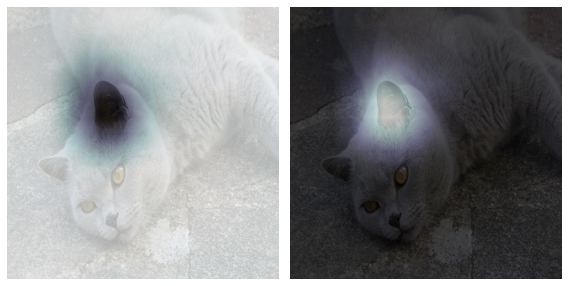

In [90]:
# 서연 수정 code
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls_o.train.decode((x_o,))[0].squeeze().show(ax=ax1)
ax1.imshow(camimg_o[0].to("cpu").detach(),alpha=0.7,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
#
dls_r.train.decode((x_o,))[0].squeeze().show(ax=ax2)
ax2.imshow(camimg_o[1].to("cpu").detach(),alpha=0.7,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

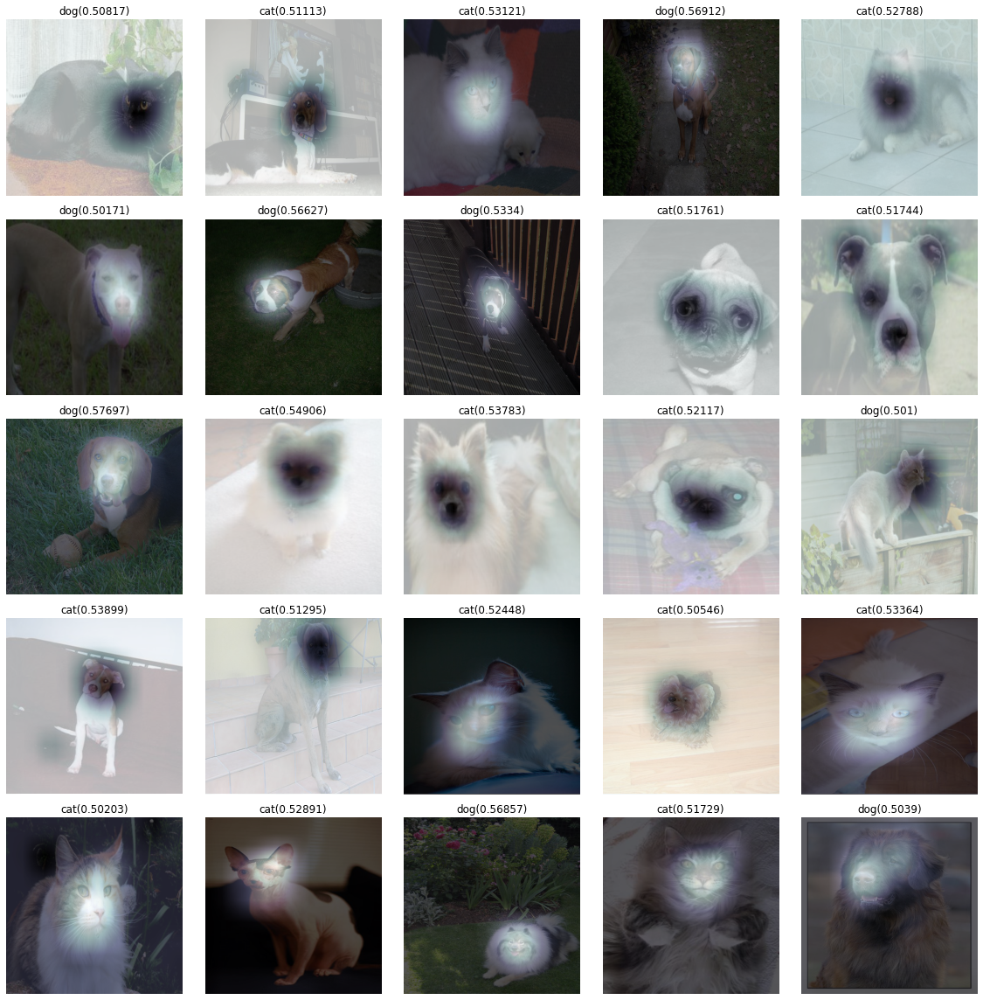

In [144]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x_o, = first(dls_o.test_dl([PILImage.create(get_image_files(path_o)[k])]))
        camimg_o = torch.einsum('ij,jkl -> ikl', net_o2[2].weight, net_o1(x_o).squeeze())
        a_o,b_o = net_r(x_o).tolist()[0]
        catprob, dogprob = np.exp(a_o)/ (np.exp(a_o)+np.exp(b_o)) ,  np.exp(b_o)/ (np.exp(a_o)+np.exp(b_o)) 
        if catprob>dogprob: 
            dls_o.train.decode((x_o,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg_o[0].to("cpu").detach(),alpha=0.7,extent=(0,512,512,0),interpolation='bilinear',cmap='bone')
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            dls_o.train.decode((x_o,))[0].squeeze().show(ax=ax[i][j])
            ax[i][j].imshow(camimg_o[1].to("cpu").detach(),alpha=0.7,extent=(0,512,512,0),interpolation='bilinear',cmap='bone')
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).

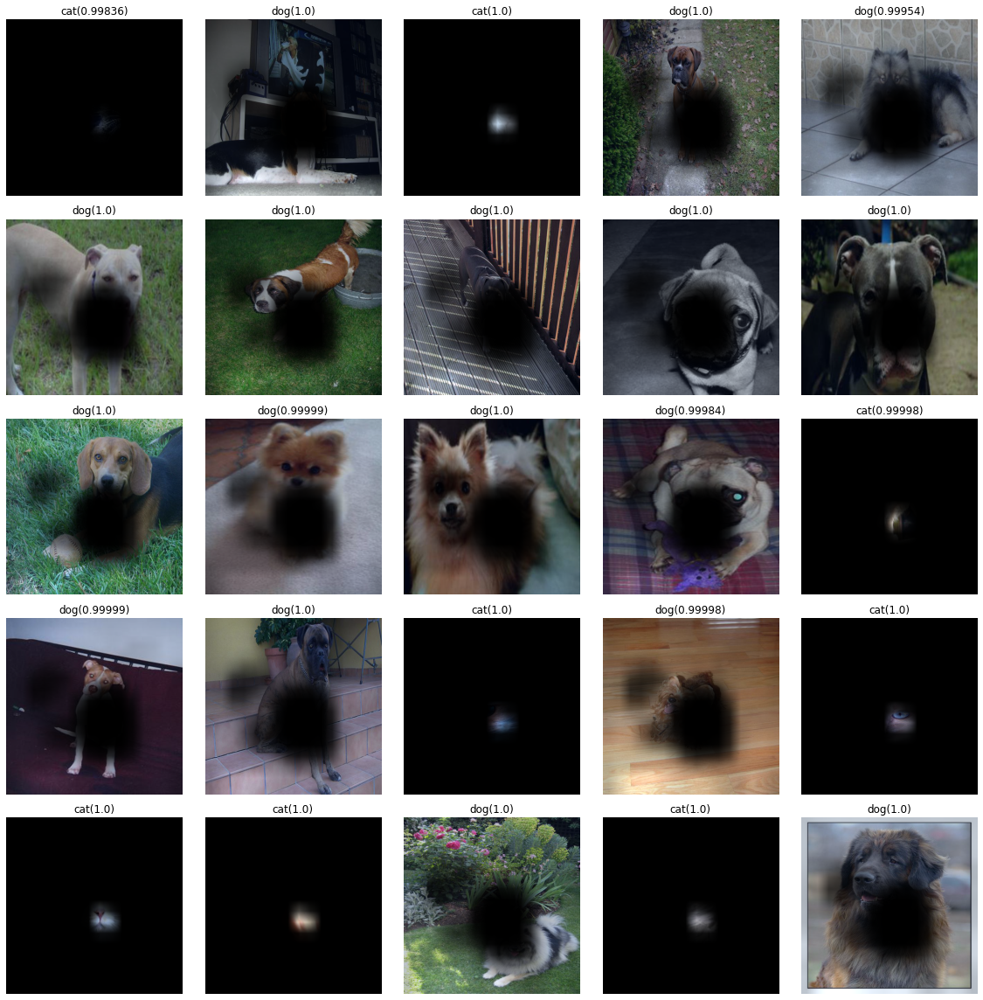

In [165]:
fig, ax = plt.subplots(5,5) 
k=0 
for i in range(5):
    for j in range(5): 
        x_o, = first(dls_o.test_dl([PILImage.create(get_image_files(path_o)[k])]))
        camimg_o = torch.einsum('ij,jkl -> ikl', net_o2[2].weight, net_o1(x).squeeze())
        a_o,b_o = net_o(x_o).tolist()[0]
        catprob, dogprob = np.exp(a_o)/ (np.exp(a_o)+np.exp(b_o)) ,  np.exp(b_o)/ (np.exp(a_o)+np.exp(b_o))
        if catprob>dogprob: 
            test=camimg_o[0]-torch.min(camimg_o[0])
            A1=torch.exp(-0.1*test)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x_o.squeeze().to('cpu')*Y1-torch.min(x_o.squeeze().to('cpu'))*Y1
            (x1*0.25).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("cat(%s)" % catprob.round(5))
        else: 
            test=camimg_o[1]-torch.min(camimg_o[1])
            A1=torch.exp(-0.1*test)
            X1=np.array(A1.to("cpu").detach(),dtype=np.float32)
            Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))
            x1=x_o.squeeze().to('cpu')*Y1-torch.min(x_o.squeeze().to('cpu'))*Y1
            (x1*0.25).squeeze().show(ax=ax[i][j])
            ax[i][j].set_title("dog(%s)" % dogprob.round(5))
        k=k+1 
fig.set_figwidth(16)            
fig.set_figheight(16)
fig.tight_layout()

-   `.mat`파일 있나 확인

In [157]:
for i in range(len(path_o.ls())) :
    img = PILImage.create(get_image_files(path_o)[i])
    img = img.resize([512,512], resample=None, box=None, reducing_gap=None)
    name = str(list(path_o.ls())[i]).split('/')[-1]
    fname = name.split('.')[-1]
    if fname!="jpg" : 
        print(name)
    else : pass

.ipynb_checkpoints

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).

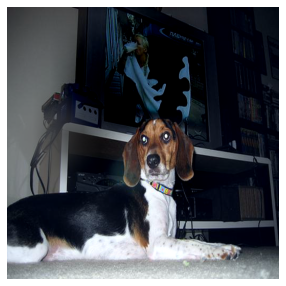

In [246]:
x_o, = first(dls_o.test_dl([PILImage.create(get_image_files(path_o)[1])]))
camimg_o = torch.einsum('ij,jkl -> ikl', net_o2[2].weight, net_o1(x).squeeze())
a_o,b_o = net_o(x_o).tolist()[0]
catprob_o, dogprob_o = np.exp(a_o)/ (np.exp(a_o)+np.exp(b_o)) ,  np.exp(b_o)/ (np.exp(a_o)+np.exp(b_o))
if catprob_o>dogprob_o: 
    test_o=camimg_o[0]-torch.min(camimg_o[0])
    A1_o=torch.exp(-0.01*test_o)
    X1_o=np.array(A1_o.to("cpu").detach(),dtype=np.float32)
    Y1_o=torch.Tensor(cv2.resize(X1_o,(512,512),interpolation=cv2.INTER_LINEAR))
    x1_o=x_o.squeeze().to('cpu')*Y1_o-torch.min(x_o.squeeze().to('cpu'))*Y1_o
    (x1_o*0.25).squeeze().show()
else: 
        test_o=camimg_o[1]-torch.min(camimg_o[1])
        A1_o=torch.exp(-0.01*test_o)
        X1_o=np.array(A1_o.to("cpu").detach(),dtype=np.float32)
        Y1_o=torch.Tensor(cv2.resize(X1_o,(512,512),interpolation=cv2.INTER_LINEAR))
        x1_o=x_o.squeeze().to('cpu')*Y1-torch.min(x_o.squeeze().to('cpu'))*Y1_o
        (x1_o*0.25).squeeze().show()

In [95]:
# #저장 참고
# np_arr = np.array(tensor, dtype=np.uint8)
# img = PIL.Image.fromarray(np_arr)
# img.save('path')

In [54]:
# name = str(list(path.ls())[1]).split('/')[-1]
# res1=(x1*0.35).squeeze()
# res1.show()
# save_image(res1, "pet3_mode1_res/"+name)
#res1.save("pet3_mode1_res/"+name)

# Step by step

In [791]:
x, = first(dls_r.test_dl([PILImage.create(get_image_files(path_r)[113])]))

In [792]:
camimg = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x).squeeze())
# camimg_o = torch.einsum('ij,jkl -> ikl', net_o2[2].weight, net_o1(x).squeeze())

In [793]:
ebayesthresh = importr('EbayesThresh').ebayesthresh

power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
ybar_threshed = torch.tensor(ybar_threshed.reshape(16,16))

power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
ybar_threshed2 = np.where(power_threshed2>1600,torch.tensor(camimg[1].detach().reshape(-1)),0)
ybar_threshed2 = torch.tensor(ybar_threshed2.reshape(16,16))

  power_threshed=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[0].detach().reshape(-1))**2)))
<ipython-input-793-17c991cf797e>:4: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  ybar_threshed = np.where(power_threshed>2000,torch.tensor(camimg[0].detach().reshape(-1)),0)
<ipython-input-793-17c991cf797e>:7: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  power_threshed2=np.array(ebayesthresh(FloatVector(torch.tensor(camimg[1].detach().reshape(-1))**2)))
<ipython-input-793-17c991cf797e>:8: UserWarning: To copy construct from a tensor, it is recommended to use sourceTensor.clone().detach() or sourceTensor.clone().detach().requires_grad_(True), rather than torch.tensor(sourceTensor).
  yb

## 흰 색 파트가 Cat

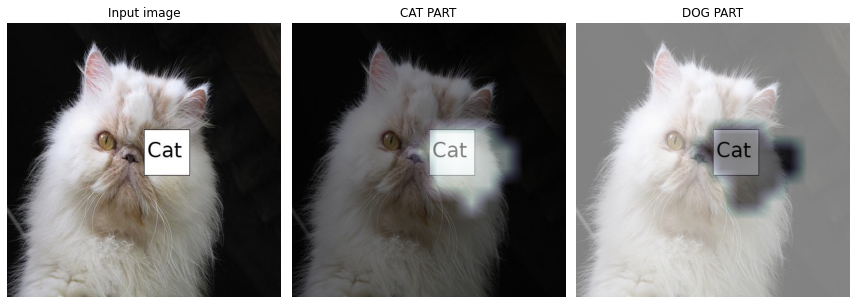

In [794]:
fig, (ax1,ax2,ax3) = plt.subplots(1,3) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("Input image")
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow((ybar_threshed).to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax2.set_title("CAT PART")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax3)
ax3.imshow((ybar_threshed2).to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax3.set_title("DOG PART")
#
fig.set_figwidth(12)            
fig.set_figheight(12)
fig.tight_layout()

In [795]:
a,b = net_r(x).tolist()[0]

In [796]:
np.exp(a)/ (np.exp(a)+np.exp(b)) ,  np.exp(b)/ (np.exp(a)+np.exp(b))

In [797]:
# test=camimg_o[0]-torch.min(camimg_o[0])

In [798]:
# T = camimg_o[0]
T = camimg[0]

In [799]:
A1=torch.exp(-0.05*(ybar_threshed))

In [800]:
T1 = torch.exp(-0.05*T)

In [801]:
A2 = 1 - A1

In [802]:
T2 = 1 - T1

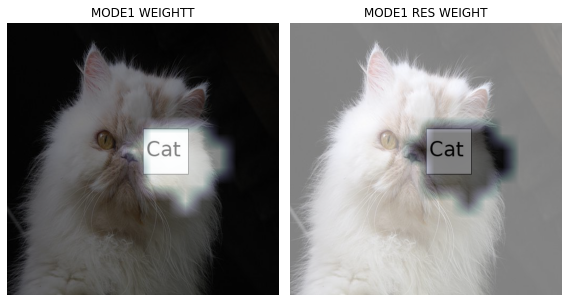

In [803]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(A2.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax1.set_title("MODE1 WEIGHTT")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(A1.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax2.set_title("MODE1 RES WEIGHT")
#
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [804]:
X1=np.array(A1.to("cpu").detach(),dtype=np.float32)

In [805]:
Y1=torch.Tensor(cv2.resize(X1,(512,512),interpolation=cv2.INTER_LINEAR))

In [806]:
x1=x.squeeze().to('cpu')*Y1-torch.min(x.squeeze().to('cpu'))*Y1

In [807]:
X12=np.array(A2.to("cpu").detach(),dtype=np.float32)

In [808]:
Y12=torch.Tensor(cv2.resize(X12,(512,512),interpolation=cv2.INTER_LINEAR))

In [809]:
x12=x.squeeze().to('cpu')*Y12-torch.min(x.squeeze().to('cpu'))*Y12

## 1st CAM 분리 결과

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).

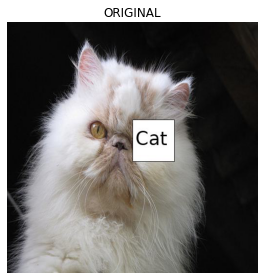

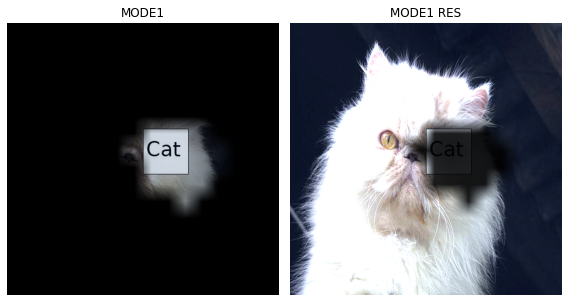

In [811]:
fig, (ax1) = plt.subplots(1,1) 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("ORIGINAL")
fig.set_figwidth(4)            
fig.set_figheight(4)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x12*0.2).squeeze().show(ax=ax1)  #MODE1
(x1*0.35).squeeze().show(ax=ax2)  #MODE1_res
ax1.set_title("MODE1")
ax2.set_title("MODE1 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [812]:
x1 = x1.reshape(1,3,512,512)

In [813]:
# camimg1 = torch.einsum('ij,jkl -> ikl', net_o2[2].weight, net_o1(x1*0.35).squeeze())
camimg1 = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x1*0.4).squeeze())

### 2rd 결과

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).

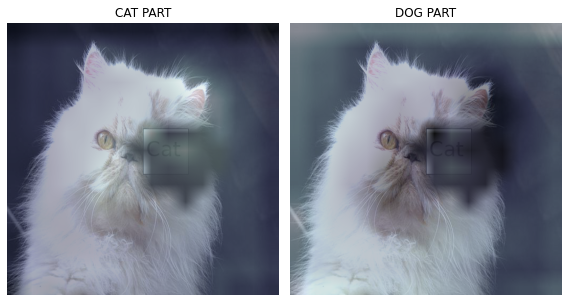

In [814]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
(x1*0.3).squeeze().show(ax=ax1)
ax1.imshow(camimg1[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax1.set_title("CAT PART")
#
(x1*0.3).squeeze().show(ax=ax2)
ax2.imshow(camimg1[1].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax2.set_title("DOG PART")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [775]:
a1,b1 = net_r(x1).tolist()[0]

In [776]:
np.exp(a1)/ (np.exp(a1)+np.exp(b1)) ,  np.exp(b1)/ (np.exp(a1)+np.exp(b1))

## 3rd CAM

In [777]:
test1=camimg1[0]-torch.min(camimg1[0])

In [778]:
A3 = torch.exp(-0.05*(test1))

In [779]:
A4 = 1 - A3

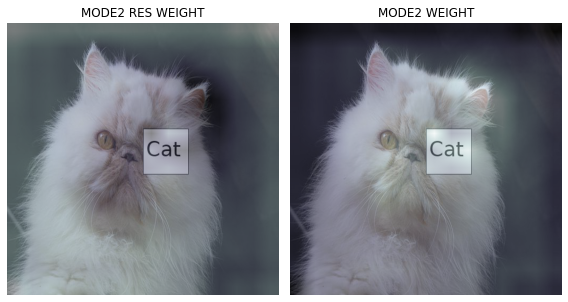

In [780]:
fig, (ax1,ax2) = plt.subplots(1,2) 
# 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.imshow(A3.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax1.set_title("MODE2 RES WEIGHT")
#
dls_r.train.decode((x,))[0].squeeze().show(ax=ax2)
ax2.imshow(A4.data.to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax2.set_title("MODE2 WEIGHT")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [781]:
X2=np.array(A3.to("cpu").detach(),dtype=np.float32)

In [782]:
Y2=torch.Tensor(cv2.resize(X2,(512,512),interpolation=cv2.INTER_LINEAR))

In [783]:
x2=(x1*0.35)*Y2-torch.min((x1*0.35)*Y2)

In [784]:
X22=np.array(A4.to("cpu").detach(),dtype=np.float32)

In [785]:
Y22=torch.Tensor(cv2.resize(X22,(512,512),interpolation=cv2.INTER_LINEAR))

In [786]:
x22=(x2*0.35)*Y22-torch.min((x2*0.35)*Y22)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).

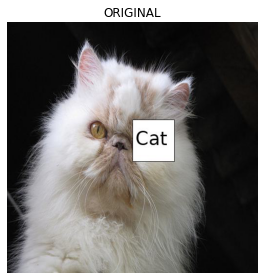

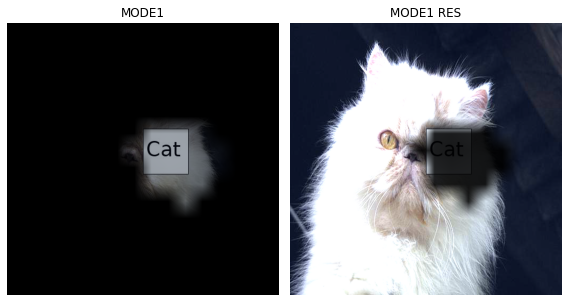

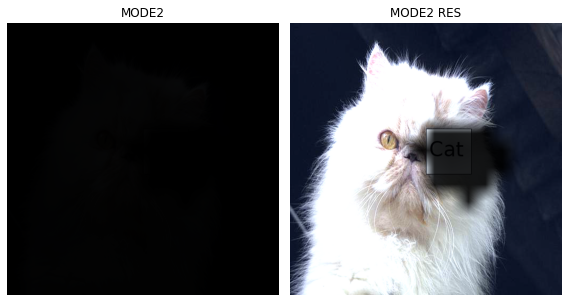

In [787]:
fig, (ax1) = plt.subplots(1,1) 
dls_r.train.decode((x,))[0].squeeze().show(ax=ax1)
ax1.set_title("ORIGINAL")
fig.set_figwidth(4)            
fig.set_figheight(4)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x12*0.15).squeeze().show(ax=ax1)  #MODE1
(x1*0.35).squeeze().show(ax=ax2)  #MODE1_res
ax1.set_title("MODE1")
ax2.set_title("MODE1 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()
#
fig, (ax1, ax2) = plt.subplots(1,2) 
(x22).squeeze().show(ax=ax1)  #MODE2
(x2).squeeze().show(ax=ax2)  #MODE2_res
ax1.set_title("MODE2")
ax2.set_title("MODE2 RES")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [701]:
x2 = x2.reshape(1,3,512,512)

In [788]:
camimg2 = torch.einsum('ij,jkl -> ikl', net_2[2].weight, net_1(x2*0.3).squeeze())

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).

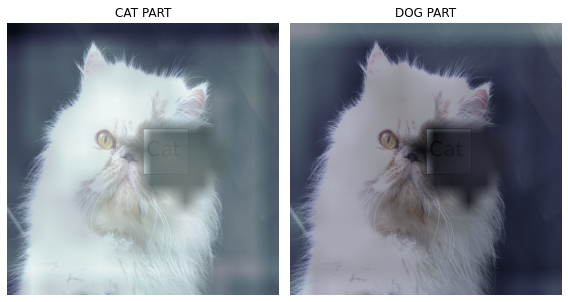

In [789]:
fig, (ax1, ax2) = plt.subplots(1,2) 
#
x2.squeeze().show(ax=ax1)
ax1.imshow(camimg2[0].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax1.set_title("CAT PART")
#
x2.squeeze().show(ax=ax2)
ax2.imshow(camimg2[1].to("cpu").detach(),alpha=0.5,extent=(0,511,511,0),interpolation='bilinear',cmap='bone')
ax2.set_title("DOG PART")
fig.set_figwidth(8)            
fig.set_figheight(8)
fig.tight_layout()

In [790]:
a2,b2 = net_r(x2).tolist()[0]
np.exp(a2)/(np.exp(a2)+np.exp(b2)), np.exp(b2)/(np.exp(a2)+np.exp(b2))